# This articles contains solution of imbalanced dataset and different models comparison!!

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import datasets, linear_model
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, mean_squared_error, r2_score
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import PolynomialFeatures
%matplotlib inline 
import os
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot
import math
from collections import Counter
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
import plotly.figure_factory as ff

# Loading the data

In [2]:
data = pd.read_csv('../input/creditcardfraud/creditcard.csv')

In [3]:
data.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [4]:
data.shape

(284807, 31)

In [5]:
data.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,3.919560e-15,5.688174e-16,-8.769071e-15,2.782312e-15,-1.552563e-15,2.010663e-15,-1.694249e-15,-1.927028e-16,-3.137024e-15,...,1.537294e-16,7.959909e-16,5.367590e-16,4.458112e-15,1.453003e-15,1.699104e-15,-3.660161e-16,-1.206049e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,...,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,...,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,...,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,...,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,...,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,...,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


# Missing data

In [6]:
total = data.isnull().sum().sort_values(ascending = False)

In [7]:
null_percentage = (data.isnull().sum() / data.isnull().count() * 100).sort_values(ascending = False)

In [8]:
pd.concat([total, null_percentage], axis=1, keys=['Total', 'Percentage']).transpose()

,Class,V14,V1,V2,V3,V4,V5,V6,V7,V8,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Time
Total,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Percentage,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# So the data is clean!!

In [9]:
data.shape

(284807, 31)

# Checking the class Imbalanced!!

In [10]:
temp_data = data['Class'].value_counts()

In [11]:
temp_data

0    284315
1       492
Name: Class, dtype: int64

In [12]:
df = pd.DataFrame({'class': temp_data.index, "values": temp_data.values})

In [13]:
df

,class,values
0,0,284315
1,1,492


In [14]:
vis = go.Bar(x = df['class'],y = df['values'],
    name="Class: Not fraud = 0, Fraud = 1",
    marker=dict(color="Red"),
    text=df['values']
)
data = [vis] 

In [15]:
layout = dict(title = "Class: Not fraud = 0, Fraud = 1",
          xaxis = dict(title = 'class', showticklabels=True), 
          yaxis = dict(title = 'Number of transactions'),
          hovermode = 'closest',width=600
         )
fig = dict(data=data, layout=layout)
iplot(fig, filename='class')

In [16]:
df['values'][0]

284315

In [17]:
data = pd.read_csv('../input/creditcardfraud/creditcard.csv')

In [18]:
not_fraud_percentage = df['values'][0]/(df['values'][0] + df['values'][1]) * 100

In [19]:
not_fraud_percentage

99.82725143693798

In [20]:
fraud_percentage = df['values'][1]/(df['values'][0] + df['values'][1]) * 100

In [21]:
fraud_percentage

0.1727485630620034

In [22]:
nf_class = data.loc[data['Class'] == 0]['Time']

In [23]:
f_class = data.loc[data['Class'] == 1]['Time']

In [24]:
hist_data = [nf_class, f_class]
group_labels = ['Not Fraud', 'Fraud']

fig = ff.create_distplot(hist_data, group_labels, show_hist=False, show_rug=False)
fig['layout'].update(title='Time wise transactions', xaxis=dict(title='Time [s]'))
iplot(fig, filename='dist_only')

In [25]:
nf_class = data.loc[data['Class'] == 0]['Amount']
f_class = data.loc[data['Class'] == 1]['Amount']
hist_data = [f_class, nf_class]
group_labels = ['Not Fraud', 'Fraud']

fig = ff.create_distplot(hist_data, group_labels, show_hist=False, show_rug=False)
fig['layout'].update(title='Amount wise transactions', xaxis=dict(title='Amount'))
iplot(fig, filename='dist_only')

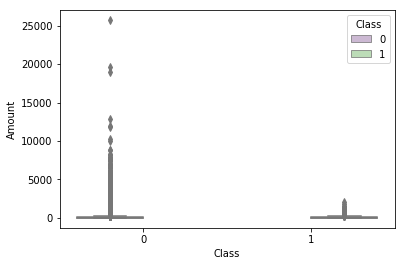

In [26]:
s = sns.boxplot(x="Class", y="Amount", hue="Class",data=data, palette="PRGn",showfliers=True)

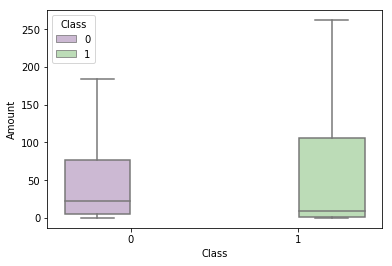

In [27]:
s = sns.boxplot(x="Class", y="Amount", hue="Class",data=data, palette="PRGn",showfliers=False)

# Let's see the description of fraud and non-fraud

In [28]:
data = pd.read_csv('../input/creditcardfraud/creditcard.csv')

In [29]:
nf_class1 = data.loc[data['Class'] == 0]['Amount']
nf_class1.describe()

count    284315.000000
mean         88.291022
std         250.105092
min           0.000000
25%           5.650000
50%          22.000000
75%          77.050000
max       25691.160000
Name: Amount, dtype: float64

In [30]:
f_class1 = data.loc[data['Class'] == 1]['Amount']
f_class1.describe()

count     492.000000
mean      122.211321
std       256.683288
min         0.000000
25%         1.000000
50%         9.250000
75%       105.890000
max      2125.870000
Name: Amount, dtype: float64

In [31]:
fraudy = data.loc[data['Class'] == 1]['Amount']
fraudx = data.loc[data['Class'] == 1]['Time']

trace = go.Scatter(
    x = fraudx,y = fraudy,
    name="Amount",
    text= fraudy,
    mode = "markers"
)
data = [trace]
layout = dict(title = 'Amount of fraudulent transactions',
          xaxis = dict(title = 'Time in seconds', showticklabels=True), 
          yaxis = dict(title = 'Amount'),
          hovermode='closest'
         )
fig = dict(data=data, layout=layout)
iplot(fig, filename='fraud-amount')

In [32]:
data = pd.read_csv('../input/creditcardfraud/creditcard.csv')

In [33]:
data.corr()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
Time,1.000000,1.173963e-01,-1.059333e-02,-4.196182e-01,-1.052602e-01,1.730721e-01,-6.301647e-02,8.471437e-02,-3.694943e-02,-8.660434e-03,...,4.473573e-02,1.440591e-01,5.114236e-02,-1.618187e-02,-2.330828e-01,-4.140710e-02,-5.134591e-03,-9.412688e-03,-0.010596,-0.012323
V1,0.117396,1.000000e+00,4.697350e-17,-1.424390e-15,1.755316e-17,6.391162e-17,2.398071e-16,1.991550e-15,-9.490675e-17,2.169581e-16,...,-1.755072e-16,7.477367e-17,9.808705e-16,7.354269e-17,-9.805358e-16,-8.621897e-17,3.208233e-17,9.820892e-16,-0.227709,-0.101347
V2,-0.010593,4.697350e-17,1.000000e+00,2.512175e-16,-1.126388e-16,-2.039868e-16,5.024680e-16,3.966486e-16,-4.413984e-17,-5.728718e-17,...,8.444409e-17,2.500830e-16,1.059562e-16,-8.142354e-18,-4.261894e-17,2.601622e-16,-4.478472e-16,-3.676415e-16,-0.531409,0.091289
V3,-0.419618,-1.424390e-15,2.512175e-16,1.000000e+00,-3.416910e-16,-1.436514e-15,1.431581e-15,2.168574e-15,3.433113e-16,-4.233770e-16,...,-2.971969e-17,4.648259e-16,2.115206e-17,-9.351637e-17,4.771164e-16,6.521501e-16,6.239832e-16,7.726948e-16,-0.210880,-0.192961
V4,-0.105260,1.755316e-17,-1.126388e-16,-3.416910e-16,1.000000e+00,-1.940929e-15,-2.712659e-16,1.556330e-16,5.195643e-16,3.859585e-16,...,-9.976950e-17,2.099922e-16,6.002528e-17,2.229738e-16,5.394585e-16,-6.179751e-16,-6.403423e-17,-5.863664e-17,0.098732,0.133447
V5,0.173072,6.391162e-17,-2.039868e-16,-1.436514e-15,-1.940929e-15,1.000000e+00,7.926364e-16,-4.209851e-16,7.589187e-16,4.205206e-16,...,-1.368701e-16,5.060029e-16,1.637596e-16,-9.286095e-16,5.625102e-16,9.144690e-16,4.465960e-16,-3.299167e-16,-0.386356,-0.094974
V6,-0.063016,2.398071e-16,5.024680e-16,1.431581e-15,-2.712659e-16,7.926364e-16,1.000000e+00,1.429426e-16,-1.707421e-16,1.114447e-16,...,-1.575903e-16,-3.362902e-16,-7.232186e-17,-1.261867e-15,1.081933e-15,-2.378414e-16,-2.623818e-16,4.813155e-16,0.215981,-0.043643
V7,0.084714,1.991550e-15,3.966486e-16,2.168574e-15,1.556330e-16,-4.209851e-16,1.429426e-16,1.000000e+00,-8.691834e-17,7.933251e-16,...,1.938604e-16,-1.058131e-15,2.327911e-16,-2.589727e-17,1.174169e-15,-7.334507e-16,-5.886825e-16,-6.836764e-17,0.397311,-0.187257
V8,-0.036949,-9.490675e-17,-4.413984e-17,3.433113e-16,5.195643e-16,7.589187e-16,-1.707421e-16,-8.691834e-17,1.000000e+00,2.900829e-16,...,-2.412439e-16,5.475559e-16,3.897104e-16,-1.802967e-16,-1.390791e-16,-1.209975e-16,1.733633e-16,-4.484325e-16,-0.103079,0.019875
V9,-0.008660,2.169581e-16,-5.728718e-17,-4.233770e-16,3.859585e-16,4.205206e-16,1.114447e-16,7.933251e-16,2.900829e-16,1.000000e+00,...,4.578389e-17,2.871855e-17,5.929286e-16,-2.346385e-16,1.099645e-15,-1.388725e-15,-2.287414e-16,9.146779e-16,-0.044246,-0.097733


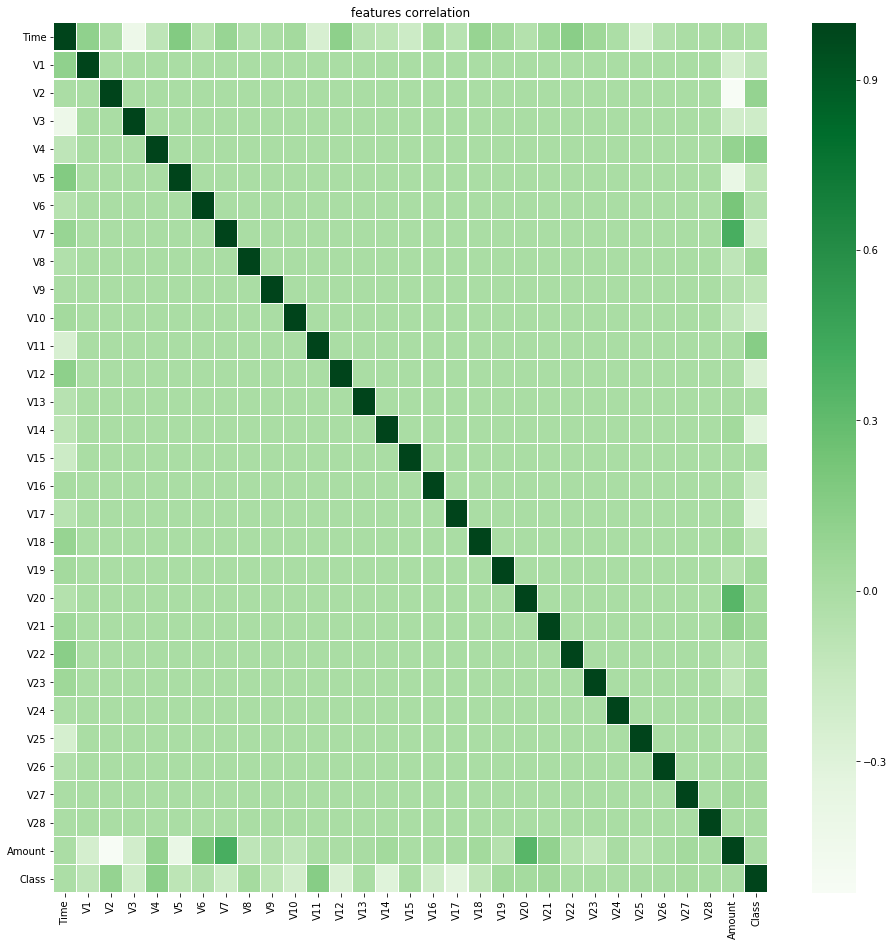

In [34]:
plt.figure(figsize = (16,16))
plt.title('features correlation')
corr = data.corr()
sns.heatmap(corr,xticklabels=corr.columns,yticklabels=corr.columns,linewidths=.1,cmap="Greens")
plt.show()

<Figure size 432x288 with 0 Axes>

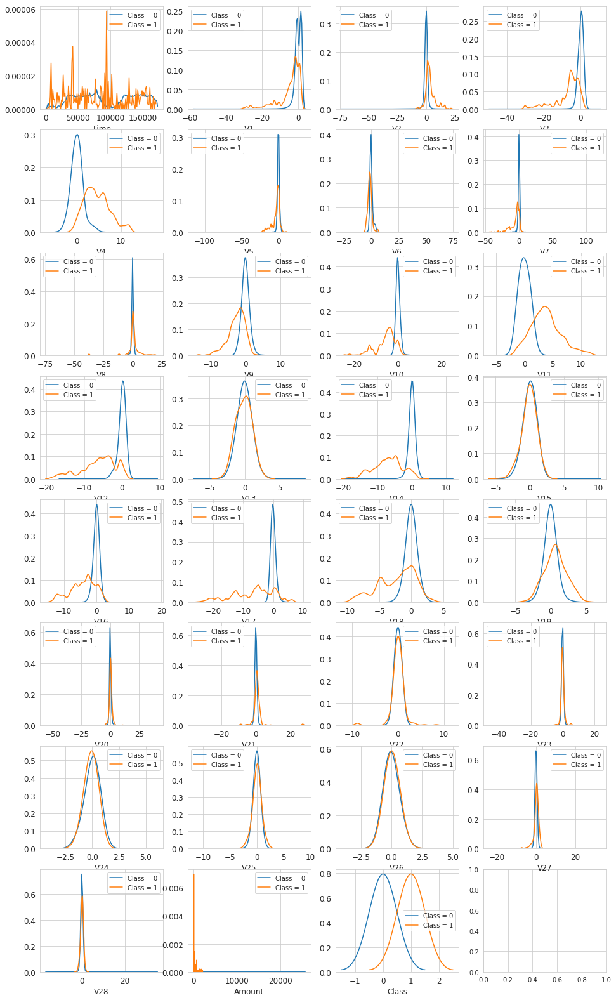

In [35]:
var = data.columns.values

i = 0
t0 = data.loc[data['Class'] == 0]
t1 = data.loc[data['Class'] == 1]

sns.set_style('whitegrid')
plt.figure()
fig, ax = plt.subplots(8,4,figsize=(16,28))

for feature in var:
    i += 1
    plt.subplot(8,4,i)
    sns.kdeplot(t0[feature], bw=0.5,label="Class = 0")
    sns.kdeplot(t1[feature], bw=0.5,label="Class = 1")
    plt.xlabel(feature, fontsize=12)
    locs, labels = plt.xticks()
    plt.tick_params(axis='both', which='major', labelsize=12)
plt.show();

In [36]:
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
            },
          });
        </script>
        '''))

In [37]:
configure_plotly_browser_state()
init_notebook_mode(connected=False)

x = data['Time']
data = [go.Histogram(x=x)]

iplot(data, filename='Time distribution')

# Creating Models

In [38]:
data = pd.read_csv('../input/creditcardfraud/creditcard.csv')

In [39]:
X = data.drop(columns=['Class'], axis=1)
y = data['Class']

In [40]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

# Logistic Regression

In [41]:
model = LogisticRegression()
model.fit(X_train, y_train)
prediction = model.predict(X_test)

/opt/conda/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning:

Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.



In [42]:
print('Accuracy Score: ', accuracy_score(y_test, prediction))

Accuracy Score:  0.9989993328885924


# Random Forest Classifier 

In [43]:
data = pd.read_csv('../input/creditcardfraud/creditcard.csv')

In [44]:
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier

In [45]:
clf = RandomForestClassifier(n_estimators=100, max_depth=2,
...                              random_state=0)

In [46]:
clf.fit(X_train,y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=2, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=0, verbose=0,
                       warm_start=False)

In [47]:
preds = clf.predict(X_test)

In [48]:
preds

array([1, 0, 0, ..., 0, 0, 0])

In [49]:
print('Accuracy Score: ', accuracy_score(y_test, preds))

Accuracy Score:  0.9990519995786665


In [50]:
clf.feature_importances_

array([1.07592090e-03, 9.98674538e-04, 2.85832093e-03, 1.09965019e-02,
       4.20327683e-03, 8.45215882e-03, 6.41058862e-03, 9.44347689e-03,
       5.60648669e-03, 4.72978008e-02, 1.27397223e-01, 1.10663876e-01,
       1.71423296e-01, 0.00000000e+00, 1.59703858e-01, 1.43058026e-03,
       1.13495767e-01, 1.44173603e-01, 6.11545430e-02, 1.96032748e-03,
       1.00610873e-03, 3.77681300e-03, 1.14101877e-03, 0.00000000e+00,
       3.71237711e-04, 3.58194342e-06, 3.99182892e-03, 6.34692668e-04,
       3.28438100e-04, 0.00000000e+00])

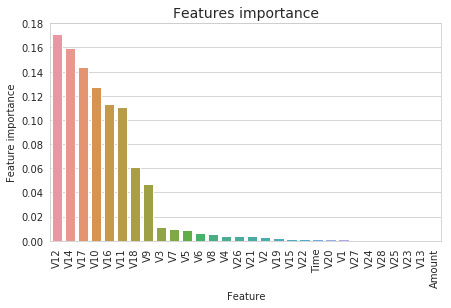

In [51]:
predictors = ['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',\
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19',\
       'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28',\
       'Amount']
tmp = pd.DataFrame({'Feature': predictors, 'Feature importance': clf.feature_importances_})
tmp = tmp.sort_values(by='Feature importance',ascending=False)
plt.figure(figsize = (7,4))
plt.title('Features importance',fontsize=14)
s = sns.barplot(x='Feature',y='Feature importance',data=tmp)
s.set_xticklabels(s.get_xticklabels(),rotation=90)
plt.show()  

# AdaBoostClassifier

In [52]:
data = pd.read_csv('../input/creditcardfraud/creditcard.csv')

In [53]:
clf = AdaBoostClassifier(n_estimators=100, random_state=0)

In [54]:
clf.fit(X_train, y_train)

AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None, learning_rate=1.0,
                   n_estimators=100, random_state=0)

In [55]:
preds = clf.predict(X_test)

In [56]:
print('Accuracy Score: ', accuracy_score(y_test, preds))

Accuracy Score:  0.9993504441557529


In [57]:
clf.feature_importances_

array([0.02, 0.02, 0.02, 0.07, 0.07, 0.03, 0.03, 0.05, 0.04, 0.02, 0.03,
       0.02, 0.05, 0.03, 0.05, 0.03, 0.04, 0.05, 0.04, 0.04, 0.02, 0.01,
       0.02, 0.01, 0.03, 0.04, 0.03, 0.03, 0.02, 0.04])

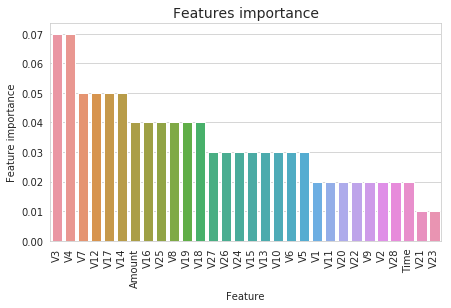

In [58]:
predictors = ['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',\
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19',\
       'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28',\
       'Amount']
tmp = pd.DataFrame({'Feature': predictors, 'Feature importance': clf.feature_importances_})
tmp = tmp.sort_values(by='Feature importance',ascending=False)
plt.figure(figsize = (7,4))
plt.title('Features importance',fontsize=14)
s = sns.barplot(x='Feature',y='Feature importance',data=tmp)
s.set_xticklabels(s.get_xticklabels(),rotation=90)
plt.show()

In [59]:
data['Class'].value_counts()

0    284315
1       492
Name: Class, dtype: int64

# SMOTEENN is used to balance the dataset!

In [60]:
data = pd.read_csv('../input/creditcardfraud/creditcard.csv')

In [61]:
from imblearn.combine import SMOTEENN
from collections import Counter

smote_enn = SMOTEENN(random_state=0)
X_resampled, y_resampled = smote_enn.fit_sample(X, y)
print(sorted(Counter(y_resampled).items()))

Using TensorFlow backend.


[(0, 265482), (1, 275801)]


In [62]:
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.33)
print (X_train.shape, y_train.shape)
print (X_test.shape, y_test.shape)

(362659, 30) (362659,)
(178624, 30) (178624,)


In [63]:
clf = RandomForestClassifier(n_estimators=100, max_depth=2,
...                              random_state=0)

In [64]:
clf.fit(X_train,y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=2, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=0, verbose=0,
                       warm_start=False)

In [65]:
preds = clf.predict(X_test)

In [66]:
print('Accuracy Score: ', accuracy_score(y_test, preds))

Accuracy Score:  0.9595687029738444


In [67]:
clf.feature_importances_

array([0.00000000e+00, 6.04419994e-03, 3.62381790e-02, 5.41229634e-02,
       9.99026442e-02, 3.75297364e-03, 1.29585552e-02, 1.99621702e-02,
       2.84703470e-03, 1.38626139e-02, 2.04322327e-01, 7.87227536e-02,
       1.10505722e-01, 0.00000000e+00, 2.52820776e-01, 0.00000000e+00,
       6.43728283e-02, 1.61453675e-02, 1.02234072e-02, 0.00000000e+00,
       1.37805340e-04, 8.92765104e-03, 2.92580375e-04, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 3.83744720e-03,
       0.00000000e+00, 0.00000000e+00])

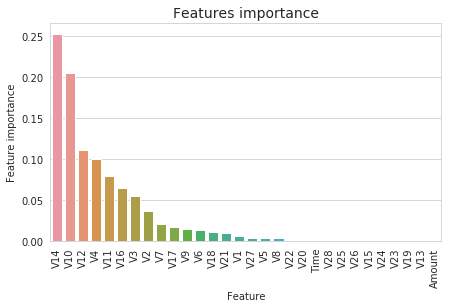

In [68]:
predictors = ['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',\
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19',\
       'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28',\
       'Amount']
tmp = pd.DataFrame({'Feature': predictors, 'Feature importance': clf.feature_importances_})
tmp = tmp.sort_values(by='Feature importance',ascending=False)
plt.figure(figsize = (7,4))
plt.title('Features importance',fontsize=14)
s = sns.barplot(x='Feature',y='Feature importance',data=tmp)
s.set_xticklabels(s.get_xticklabels(),rotation=90)
plt.show()

In [69]:
clf = AdaBoostClassifier(n_estimators=100, random_state=0)

In [70]:
clf.fit(X_train, y_train)

AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None, learning_rate=1.0,
                   n_estimators=100, random_state=0)

In [71]:
print('Accuracy Score: ', accuracy_score(y_test, preds))

Accuracy Score:  0.9595687029738444


In [72]:
clf.feature_importances_

array([0.07, 0.02, 0.03, 0.05, 0.07, 0.03, 0.04, 0.03, 0.05, 0.02, 0.04,
       0.03, 0.06, 0.01, 0.12, 0.02, 0.02, 0.01, 0.05, 0.04, 0.01, 0.02,
       0.02, 0.01, 0.02, 0.01, 0.01, 0.03, 0.03, 0.03])

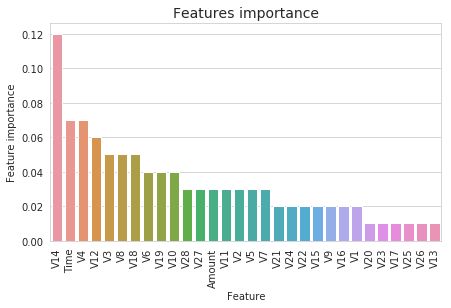

In [73]:
predictors = ['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',\
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19',\
       'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28',\
       'Amount']
tmp = pd.DataFrame({'Feature': predictors, 'Feature importance': clf.feature_importances_})
tmp = tmp.sort_values(by='Feature importance',ascending=False)
plt.figure(figsize = (7,4))
plt.title('Features importance',fontsize=14)
s = sns.barplot(x='Feature',y='Feature importance',data=tmp)
s.set_xticklabels(s.get_xticklabels(),rotation=90)
plt.show()

# Naive Bayes Algorithm

In [74]:
data = pd.read_csv('../input/creditcardfraud/creditcard.csv')

In [75]:
from sklearn.naive_bayes import GaussianNB

In [76]:
model = GaussianNB()
model.fit(X_train, y_train)

GaussianNB(priors=None, var_smoothing=1e-09)

In [77]:
preds = model.predict(X_test)

In [78]:
print('Accuracy Score: ', accuracy_score(y_test, preds))

Accuracy Score:  0.8712547026155499


In [79]:
print ("Score:", model.score(X_test, y_test))

Score: 0.8712547026155499


In [80]:
preds

array([0, 0, 0, ..., 1, 0, 0])

# Neural Network

In [81]:
data = pd.read_csv('../input/creditcardfraud/creditcard.csv')

In [82]:
from sklearn.neural_network import MLPClassifier

In [83]:
mlp = MLPClassifier(hidden_layer_sizes=(30,30,30))
mlp.fit(X_train,y_train)

MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(30, 30, 30), learning_rate='constant',
              learning_rate_init=0.001, max_iter=200, momentum=0.9,
              n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
              random_state=None, shuffle=True, solver='adam', tol=0.0001,
              validation_fraction=0.1, verbose=False, warm_start=False)

In [84]:
predictions = mlp.predict(X_test)
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98     88001
           1       0.99      0.97      0.98     90623

    accuracy                           0.98    178624
   macro avg       0.98      0.98      0.98    178624
weighted avg       0.98      0.98      0.98    178624



In [85]:
print ("Score:", mlp.score(X_test, y_test))

Score: 0.9795380240057328


# This work is based on other works. I have analysed the previous approached and tried to do some modifications as well as experimenting other models. Any sugguestion will be appreciated. Thanks. END